<a href="https://colab.research.google.com/github/AvichalJain/Learn_To_Cartoonize-SOC2/blob/main/DCGAN_implementaion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Importing

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns

import cv2 
import os
import random

import torch
import torch.nn as nn
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision.datasets import MNIST
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary

from IPython.display import display

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

#Data Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/Kaggle/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download "splcher/animefacedataset"

!unzip "/content/animefacedataset.zip" &> /dev/null

mkdir: cannot create directory ‘/root/.kaggle’: File exists
 98% 385M/395M [00:09<00:00, 36.7MB/s]
100% 395M/395M [00:09<00:00, 41.5MB/s]


In [ ]:
root = r'/content/images'
fnames = os.listdir(r'/content/images')

In [ ]:
len(fnames)

63565

In [ ]:
fnames = fnames[:32768] #taking small dataset to reduce training time

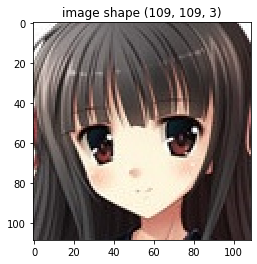

In [ ]:
img = cv2.cvtColor(cv2.imread(os.path.join(root, fnames[69+0])), cv2.COLOR_BGR2RGB)
plt.imshow(img);
plt.title(f"image shape {img.shape}");

#Parameters


this cell contains all the parameters used in this model

In [ ]:
IMG_SIZE = 64  #size of images generated and sampled from real data
IMG_CHANNELS = 3 #number of color channels in the image

BATCH_SIZE = 128 #the number of images taken in one go
NUM_EPOCHS = 50 #number of times the whole dataset was pass through model
LEARNING_RATE = 0.0002 #learning rate of our model --- tweak this to achive faster learning (high learning rate) but careful error may diverge

BETA_1 = 0.5 #coefficients used for computing running averages of gradient and its square used in Adam optimizer 
BETA_2 = 0.999


DESC_TRAIN_REP = 1 #this thing controls how many times discriminator will get train for one time training of generator per batch

Z_DIM = 100 #dimension of noise vector (latent space vector)

SAMPLE_EPOCH = 5 #after how many epoch should we sample images from generator
SAMPLE_IMAGES = 16 #how many images to sample

transform added to real images during loading

In [ ]:
Transforms = transforms.Compose([transforms.ToTensor(), transforms.Resize(IMG_SIZE), transforms.Normalize((0.5,), (0.5,))])

#Dataset and DataLoader Class

neat way to acess data 

i used caching here to stroe already fetched data into memroy,  makes 
training fast

In [ ]:
class MyDataset(Dataset):
  def __init__(self, root_path, f_names, Transforms=None):
    self.root = root_path
    self.fnames = f_names
    self.Transforms = Transforms
    self.cached_data = {}
  
  def __len__(self):
    return len(self.fnames)
  
  def __getitem__(self, index):
    if index not in self.cached_data:
      #print(f"adding {index} in cached")
      img = cv2.cvtColor(cv2.imread(os.path.join(root, fnames[index])), cv2.COLOR_BGR2RGB)
      img = self.Transforms(img)
      self.cached_data[index] = img
    return self.cached_data[index]

In [ ]:
dataset = MyDataset(root, fnames, Transforms) # creasting an instance of DATASET

In [ ]:
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True, ) # dataloader to load data in batches

below function fetch the noise vector from latent space

normalised vector of dimension [BATCH_SIZE, Z_DIM]

In [ ]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

assert get_noise(BATCH_SIZE, Z_DIM, device).shape == torch.Size([BATCH_SIZE, Z_DIM])

#Generator

this class is the model which generate image from given noise vector from latent space, 

The model architecture is similar to GENERATOR on **DCGAN'S** PAPER 

In [ ]:
class Generator(nn.Module):
  def __init__(self, z_dim=100, img_channels=3, hidden_dim=64):
    super(Generator, self).__init__()
    self.z_dim = z_dim
    self.gen = nn.Sequential(
          #input = dimension of z being (z_dim, 1, 1)
          self.block_(z_dim, hidden_dim*8, 4, stride=1, padding=0, bias=False), # size == 1024 filters of 4x4

          #input (1024, 4, 4)
          self.block_(hidden_dim*8, hidden_dim*4, 4, stride=2, padding=1, bias=False), #size == 512 filter of 8x8

          #input (512, 8, 8)
          self.block_(hidden_dim*4, hidden_dim*2, 4, stride=2, padding=1, bias=False), # size == 256 filters of 16x16

          #input (256, 16, 16)
          self.block_(hidden_dim*2, hidden_dim*1, 4, stride=2, padding=1, bias=False), #size == 128 filters of 32x32

          #input (128, 32, 32)
          nn.ConvTranspose2d(hidden_dim*1, img_channels, 4, stride=(2, 2), padding=1, bias=False), #size = (img_channels) filters of 64x64
          nn.Tanh(),
        )
  def forward (self, noise_z):
    #noise_z of shape is num_baches, z_dim
    #reshape it into (num_batches, z_dim, 1, 1)
    z = noise_z.view(len(noise_z), self.z_dim, 1, 1)
    return self.gen(z)

  def block_(self, in_dim, out_dim, kernel_size, stride=1, padding=0, bias=False):
    return nn.Sequential(
          nn.ConvTranspose2d(in_dim, out_dim, kernel_size=kernel_size, stride=stride,  padding=padding, bias=bias),
          nn.BatchNorm2d(out_dim),
          nn.ReLU(inplace=True)
        )
Generator()

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=Tr

#Discriminator

tis is the discriminator model that discriminates the given images whether it is real or fake

model architecture is similar to DCGAN's paper architecture 

In [ ]:
class Discriminator(nn.Module):
  def __init__(self, img_channels=3, hidden_dim=64):
    super(Discriminator, self).__init__()
    self.desc = nn.Sequential(
        #input img_channels x 64 x 64
        self.block_(img_channels, hidden_dim, kernel_size=4, stride=2, padding=1, bias=False), #size == 64 filters of 32x32

        #input 64 x 32 x 32
        self.block_(hidden_dim, hidden_dim*2, kernel_size=4, stride=2, padding=1, bias=False),#size == 128 filters of 16x16

        #input 128 x 16 x 16
        self.block_(hidden_dim*2, hidden_dim*4, kernel_size=4, stride=2, padding=1, bias=False),#size == 256 filters of 8 x 8

        #input 256x8x8
        self.block_(hidden_dim*4, hidden_dim*8, kernel_size=4, stride=2, padding=1, bias=False),#size == 512 filters of 4x4
        
        #input 512x4x4
        nn.Conv2d(hidden_dim*8, 1, kernel_size=4, stride=1, padding=0, bias=False),#size == 1 x 1 x 1
        nn.Sigmoid()
    )
  
  def forward(self, x):
    return self.desc(x)

  def block_(self, in_dim, out_dim, kernel_size, stride, padding, bias=False):
    return nn.Sequential(
        nn.Conv2d(in_dim, out_dim, kernel_size=kernel_size, stride=stride, padding=padding, bias=bias),
        nn.BatchNorm2d(out_dim),
        nn.LeakyReLU(0.2, inplace=True)
    )

Discriminator()

Discriminator(
  (desc): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=T

#Training

###discriminator and generator loss

In [ ]:
criterion = nn.BCELoss() #BInary cross entropy loss is used as loss function

In [ ]:
def get_gen_loss(desc_fake_pred, criterion):
    '''
    Return the loss of a generator given the discriminators's scores of the generator's fake images.
    Parameters:
        disc_fake_pred: the discriminator's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    gen_loss = criterion(desc_fake_pred, torch.ones_like(desc_fake_pred))

    return gen_loss
assert get_gen_loss(torch.tensor([1.0, 1.0, 1.0]), criterion) == (0.)

In [ ]:
def get_desc_loss(desc_fake_pred, desc_real_pred, criterion):
    '''
    Return the loss of a descriminator given the descriminator's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        desc_fake_pred: the descriminators's scores of the fake images
        desc_real_pred: the descriminator's scores of the real images
    Returns:
        desc_loss: a scalar for the descriminator's loss, accounting for the relevant factors
    '''

    desc_fake_loss = criterion(desc_fake_pred, torch.zeros_like(desc_fake_pred))
    desc_real_loss = criterion(desc_real_pred, torch.ones_like(desc_real_pred))
    desc_loss = (desc_fake_loss + desc_real_loss) / 2

    return desc_loss
assert get_desc_loss(torch.tensor([0.0, 0.0, 0.0]), torch.tensor([1.0, 1.0, 1.0]), criterion) == (0.)

###Initialization

random weight initialization with mean=0.0 and std = 0.02

In [ ]:
gen = Generator(Z_DIM, IMG_CHANNELS).to(device)
desc = Discriminator(IMG_CHANNELS).to(device)

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

initializing from random initialization

In [ ]:
gen = gen.apply(weights_init)
desc = desc.apply(weights_init)

optimizers for generator and discriminator

In [ ]:
gen_opt = torch.optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(BETA_1, BETA_2))
desc_opt = torch.optim.Adam(desc.parameters(), lr=LEARNING_RATE, betas=(BETA_1, BETA_2))

##training

In [ ]:
def show_tensor_images(image_tensor, num_images=16, size=(1, 64, 64)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=4)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.axis('off')
    plt.title(f'generated images')
    plt.show()


###trainnig loop

In [ ]:
desc_losses = []
gen_losses = []
gen_images = {}
min_desc_epoch_loss = float('inf')
min_gen_epoch_loss = float('inf')

================================================================== EPOCH-1 TRAINING ==================================================================
generators loss- 909.9622590243816
descriminators loss - 59.68383388966322
----------------------------------------- appending losses -----------------------------------------
---------------------------------- sampling some generated images ----------------------------------


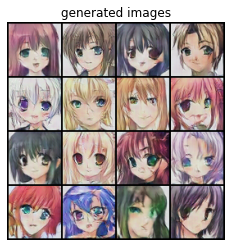

================================================================== EPOCH-2 TRAINING ==================================================================
generators loss- 900.7155406326056
descriminators loss - 34.93962864205241
---------------------------------- saving descriminators weights -----------------------------------
----------------------------------------- appending losses -----------------------------------------
================================================================== EPOCH-3 TRAINING ==================================================================
generators loss- 867.9363158717752
descriminators loss - 64.56886079162359
----------------------------------------- appending losses -----------------------------------------
================================================================== EPOCH-4 TRAINING ==================================================================
generators loss- 852.7204550504684
descriminators loss - 54.91691933572292
-------------------

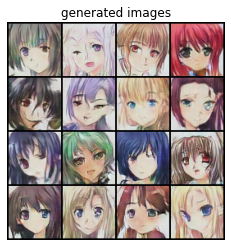

================================================================== EPOCH-7 TRAINING ==================================================================
generators loss- 919.4983531422913
descriminators loss - 51.16659601032734
----------------------------------------- appending losses -----------------------------------------
================================================================== EPOCH-8 TRAINING ==================================================================
generators loss- 893.4951715916395
descriminators loss - 59.44452142342925
----------------------------------------- appending losses -----------------------------------------
================================================================== EPOCH-9 TRAINING ==================================================================
generators loss- 909.1083333790302
descriminators loss - 49.90510802343488
----------------------------------------- appending losses -----------------------------------------
===================

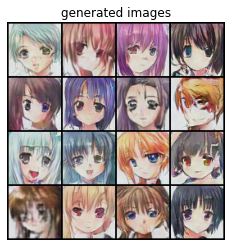

================================================================= EPOCH-12 TRAINING ==================================================================
generators loss- 990.3337035775185
descriminators loss - 30.310940019786358
---------------------------------- saving descriminators weights -----------------------------------
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-13 TRAINING ==================================================================
generators loss- 940.0276770350174
descriminators loss - 54.095792058855295
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-14 TRAINING ==================================================================
generators loss- 960.2398032993078
descriminators loss - 59.59686329960823
-----------------

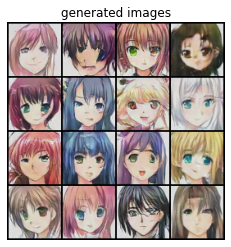

================================================================= EPOCH-17 TRAINING ==================================================================
generators loss- 936.5241419970989
descriminators loss - 50.41149025037885
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-18 TRAINING ==================================================================
generators loss- 961.0914750248194
descriminators loss - 56.851401932537556
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-19 TRAINING ==================================================================
generators loss- 991.0216659754515
descriminators loss - 31.34717681258917
----------------------------------------- appending losses -----------------------------------------
==================

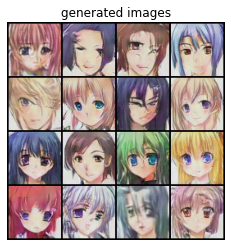

================================================================= EPOCH-22 TRAINING ==================================================================
generators loss- 1017.9990681260824
descriminators loss - 43.46537256240845
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-23 TRAINING ==================================================================
generators loss- 1037.640642002225
descriminators loss - 32.290251007303596
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-24 TRAINING ==================================================================
generators loss- 1038.4537601023912
descriminators loss - 36.668463319540024
----------------------------------------- appending losses -----------------------------------------
===============

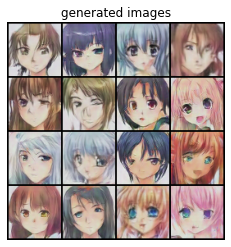

================================================================= EPOCH-27 TRAINING ==================================================================
generators loss- 1083.259243298322
descriminators loss - 40.48175558075309
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-28 TRAINING ==================================================================
generators loss- 937.0609016418457
descriminators loss - 52.795863568782806
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-29 TRAINING ==================================================================
generators loss- 1104.1513684988022
descriminators loss - 16.755981033667922
----------------------------------------- appending losses -----------------------------------------
================

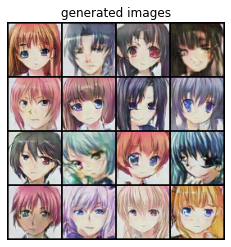

================================================================= EPOCH-32 TRAINING ==================================================================
generators loss- 1063.7267028689384
descriminators loss - 24.878192223608494
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-33 TRAINING ==================================================================
generators loss- 1171.5063531398773
descriminators loss - 8.622801005840302
---------------------------------- saving descriminators weights -----------------------------------
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-34 TRAINING ==================================================================
generators loss- 967.2293476238847
descriminators loss - 59.27335090376437
----------------

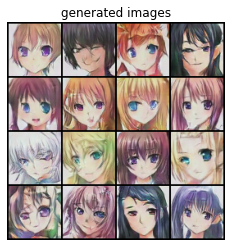

================================================================= EPOCH-37 TRAINING ==================================================================
generators loss- 1196.4456007480621
descriminators loss - 8.936730705201626
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-38 TRAINING ==================================================================
generators loss- 988.5125023187138
descriminators loss - 62.12968527060002
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-39 TRAINING ==================================================================
generators loss- 1076.8372450768948
descriminators loss - 23.967756796628237
----------------------------------------- appending losses -----------------------------------------
================

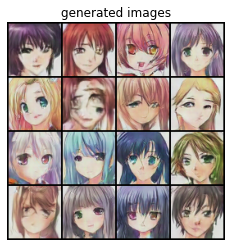

================================================================= EPOCH-42 TRAINING ==================================================================
generators loss- 1175.533784430474
descriminators loss - 25.00561250373721
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-43 TRAINING ==================================================================
generators loss- 1134.7196764349937
descriminators loss - 33.0716992970556
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-44 TRAINING ==================================================================
generators loss- 1269.3006966114044
descriminators loss - 6.711734477430582
---------------------------------- saving descriminators weights -----------------------------------
------------------

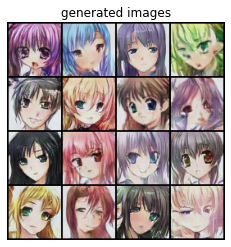

================================================================= EPOCH-47 TRAINING ==================================================================
generators loss- 1069.5394576601684
descriminators loss - 37.52556191571057
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-48 TRAINING ==================================================================
generators loss- 1211.367619752884
descriminators loss - 9.557034177705646
----------------------------------------- appending losses -----------------------------------------
================================================================= EPOCH-49 TRAINING ==================================================================
generators loss- 1323.7316608428955
descriminators loss - 5.502464243210852
---------------------------------- saving descriminators weights -----------------------------------
-----------------

In [ ]:
for epoch in range(NUM_EPOCHS):
  print(f" EPOCH-{epoch+1} TRAINING ".center(150, "="))
  desc_epoch_loss = 0
  gen_epoch_loss = 0

  for i, data in enumerate(dataloader):
    data = data.to(device)

    ########### Training Descriminator ################

    #the descriminator will be trained a few more times than generator per batch
    #to ensure that descriminator is a little advanced as compare to generator for better results
    desc_avg_loss = 0
    for _ in range(DESC_TRAIN_REP):
      desc_opt.zero_grad()
      fake_noise = get_noise(BATCH_SIZE, Z_DIM, device=device)
      fake = gen(fake_noise)
      desc_fake_pred = desc(fake.detach())
      desc_real_pred = desc(data)

      # epsilon = torch.rand(BATCH_SIZE, 1, 1, 1, device=device, requires_grad=True)#to be used in finding gradient penality
      # gradient = get_gradient(desc, data, fake.detach(), epsilon)
      # gp = gradient_penalty(gradient)
      desc_loss = get_desc_loss(desc_fake_pred, desc_real_pred, criterion)

      desc_avg_loss += desc_loss.item()#add the average loss
      desc_loss.backward(retain_graph=True) # Update gradients
      desc_opt.step() #optimize 
    desc_avg_loss /= DESC_TRAIN_REP
    desc_epoch_loss += desc_avg_loss
    # print("desc epoch loss", desc_epoch_loss)

    ########### Training Generator ################
    gen_opt.zero_grad()
    fake_noise = get_noise(BATCH_SIZE, Z_DIM, device=device)
    fake = gen(fake_noise)
    desc_fake_pred = desc(fake)

    gen_loss = get_gen_loss(desc_fake_pred, criterion)
    gen_loss.backward()

    gen_opt.step()# Update the weights

    gen_epoch_loss += gen_loss.item()
    # print("gen_epoch_loss", gen_epoch_loss)

  ############ writing some statics to analyse model ############

  #printing this epoch losses
  print(f"generators loss- {gen_epoch_loss}")
  print(f"descriminators loss - {desc_epoch_loss}")
  
  #saving state dict of models
  if(epoch>0):
    if desc_epoch_loss < min_desc_epoch_loss:
      min_desc_epoch_loss = desc_epoch_loss
      print(' saving descriminators weights '.center(100, '-'))
      torch.save({
            'epoch': epoch,
            'desc_model_state_dict': desc.state_dict(),
            'desc_optimizer_state_dict': desc_opt.state_dict(),
            'loss': desc_epoch_loss,
            }, r'/content/drive/MyDrive/Colab Notebooks/discriminators weight/weights')
      
      if gen_epoch_loss < min_gen_epoch_loss:
        min_gen_epoch_loss = gen_epoch_loss
        print(' saving generators weights '.center(100, '-'))
        torch.save({
              'epoch': epoch,
              'gen_model_state_dict': gen.state_dict(),
              'gen_optimizer_state_dict': gen_opt.state_dict(),
              'loss': gen_epoch_loss,
              }, r'/content/drive/MyDrive/Colab Notebooks/generator weights/weights')
        
  #saving loss per epoch
  print(' appending losses '.center(100, '-'))
  desc_losses.append(desc_epoch_loss)
  gen_losses.append(gen_epoch_loss)
        
  #saving sample images after few epochs
  if epoch%SAMPLE_EPOCH==0:
    print(' sampling some generated images '.center(100, '-'))
    fake_noise = get_noise(SAMPLE_IMAGES, Z_DIM, device=device)
    fake = gen(fake_noise)
    desc_fake_pred = desc(fake)

    fake = fake.detach().cpu()
    desc_fake_pred.detach().cpu()

    gen_images[epoch] = (fake, desc_fake_pred)

    show_tensor_images(fake, num_images=16, size=(1, 64, 64))

#Visualisation

###loading weights from file

In [ ]:
desc_checkpoint = torch.load('/content/drive/MyDrive/Colab Notebooks/discriminators weight/weights')
desc.load_state_dict(desc_checkpoint['desc_model_state_dict'])
desc_opt.load_state_dict(desc_checkpoint['desc_optimizer_state_dict'])

In [ ]:
gen_checkpoint = torch.load('/content/drive/MyDrive/Colab Notebooks/generator weights/weights')
gen.load_state_dict(gen_checkpoint['gen_model_state_dict'])
gen_opt.load_state_dict(gen_checkpoint['gen_optimizer_state_dict'])

###results

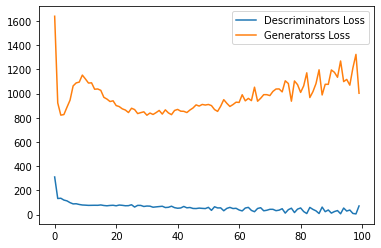

In [ ]:
plt.figure()
plt.plot(desc_losses, label='Descriminators Loss')
plt.plot(gen_losses, label='Generatorss Loss')
plt.legend()
plt.show()

  the loss function does not converges 

  **Expected Reasons-**

* training for less epochs : try to increase NUM_EPOCHS

* Using Less Data : so try to use whole data by removing cell (fnames = fnames [:32768)

* Mode Collapse : WE can use Gradient Penality with Wasserstein LOSS 

#####Animation showing evolution of generated images

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML
import torchvision.utils as vutils

In [ ]:
img_list = []
for fake, label in gen_images.values():
  img_list.append(vutils.make_grid(fake, nrow=4, padding=2, normalize=True))

In [ ]:
img_list[0].shape

torch.Size([3, 266, 266])

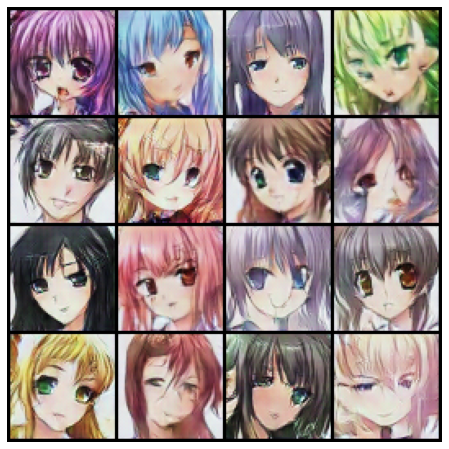

In [ ]:
fig = plt.figure(figsize=(8,8));
plt.axis("off");
ims = [[plt.imshow(np.transpose(i,(1, 2, 0)), animated=True)] for i in img_list];
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True);

HTML(ani.to_jshtml())

SAMPLE IMAGES TAKEN OVER COURSE OF TRAINING

+++++++++++++++++++++++++++++ [epoch-0] ++++++++++++++++++++++++++++++


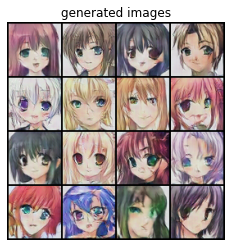

+++++++++++++++++++++++++++++ [epoch-5] ++++++++++++++++++++++++++++++


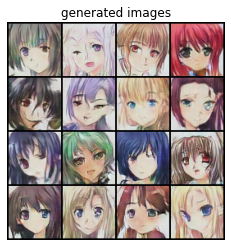

+++++++++++++++++++++++++++++ [epoch-10] +++++++++++++++++++++++++++++


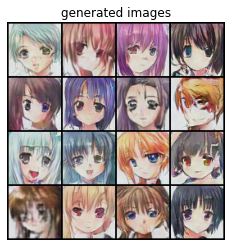

+++++++++++++++++++++++++++++ [epoch-15] +++++++++++++++++++++++++++++


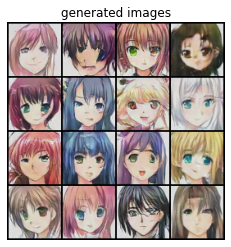

+++++++++++++++++++++++++++++ [epoch-20] +++++++++++++++++++++++++++++


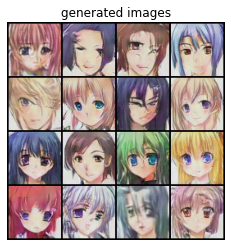

+++++++++++++++++++++++++++++ [epoch-25] +++++++++++++++++++++++++++++


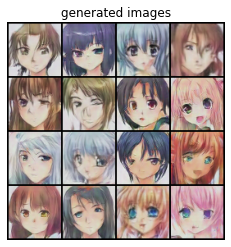

+++++++++++++++++++++++++++++ [epoch-30] +++++++++++++++++++++++++++++


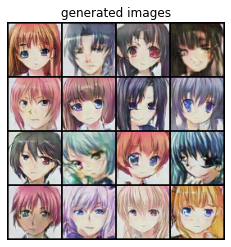

+++++++++++++++++++++++++++++ [epoch-35] +++++++++++++++++++++++++++++


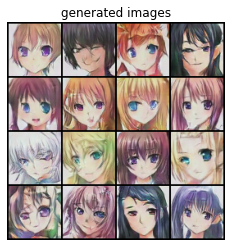

+++++++++++++++++++++++++++++ [epoch-40] +++++++++++++++++++++++++++++


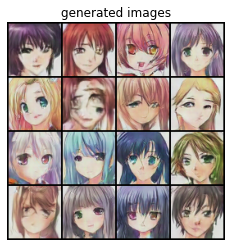

+++++++++++++++++++++++++++++ [epoch-45] +++++++++++++++++++++++++++++


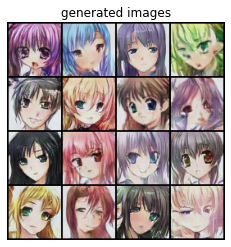

In [ ]:
for key, val in gen_images.items():
  print(f" [epoch-{key}] ".center(70, "+"))
  show_tensor_images(val[0], num_images=16, size=(1, 64, 64))